In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import time
from scipy.interpolate import interp1d
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML        
%matplotlib inline

In [2]:
#constants in meters
Lx=3200000 #zonal domain size
Ly=2000000 #meridional domain size
H1=1500 #mean upper layer thickness
H2=2500 #mean bottom layer thickness
H=4000 #thickness for barotropic fluid
Hb=1000 #ridge height
Wb=150000 #ridge width
Xb=0 #ridge longitude
f=-1e-4 #coriolois parameter
g=9.81 #gravity
rg=.01 #reduced gravity
rho0=1000 #density
rb=2e-4 #drag velocity
beta=1.5e-11 #coriolis parameter gradient
nu=1000 #Eddy viscosity
K=400 #Eddy diffusion
tau_d=24*3600 #[s] seconds in a day

In [3]:
#set up of problem in spectral space
N=200 # number of fourier modes
dx=Lx/N
dy=Ly/N
y = np.arange(-Ly/2,Ly/2,dy)
x = np.arange(-Lx/2,Lx/2,dx)
k = np.reshape(2*np.pi*np.fft.fftfreq(N,d=dx),(1,N))
ksq_recip = np.zeros((1,N))
ksq_recip[0,1:N-1]=1/k[0,1:N-1]**2

In [4]:
#setting up time stepping
years=300
t1year=31536000
tmax=t1year * years #seconds in a year
dt=500 #time in each step
dt_save=t1year/100
Nt=np.ceil(tmax/dt).astype('int') #number of time steps +1
Nt_save=np.floor(tmax/dt_save).astype('int')

In [5]:
# bythemetry 
etab=np.zeros((1,N)) #initialize ridge
etab = Hb * np.exp(-((x-Xb)/(.5*Wb))**2) #calculates ridge
etabhat=(np.fft.fft(etab)) #put etab in spectral space

In [6]:
# file naming convention
def barotropicFile(tau_0,tau_1,tau_p):
    if tau_p>1e15:
        return "Bt_mean"+str(tau_0)+"_constantWind.npz"
    else:
        return "Bt_mean"+str(tau_0)+"_"+str(tau_1)+"_period"+str(tau_p/tau_d)+".npz"
def twoLayerFile(tau_0,tau_1,tau_p,Taabw,K):
    if K==400:
        if tau_p>1e15:
            return "Bc2layer_mean"+str(tau_0)+"_constantWind_Taabw"+str(Taabw)+".npz"
        else:
            return "Bc2layer_mean"+str(tau_0)+"_"+str(tau_1)+"_period"+str(tau_p/tau_d)+"_Taabw"+str(Taabw)+".npz"
    else:
        if tau_p>1e15:
            return "Bc2layer_mean"+str(tau_0)+"K_"+str(K)+"_constantWind_Taabw"+str(Taabw)+".npz"
        else:
            return "Bc2layer_mean"+str(tau_0)+"K"+str(K)+str(tau_1)+"_period"+str(tau_p/tau_d)+"_Taabw"+str(Taabw)+".npz"

In [7]:
def windForcingBarotropicFluid(tau_0,tau_1,tau_p):
    
    #initalizing arrays
    U=0
    Uback=0 #for AB3 time step
    Uback2=0
    psiback=np.zeros((1,N))
    dt_psihat=np.zeros((1,N))
    dt_psiback=np.zeros((1,N))
    psiback2=np.zeros((1,N))
    dt_back2=np.zeros((1,N))
    psi=np.zeros((1,N))#initalizing perturbation component
    psihat=np.zeros((1,N),dtype=np.complex128) #intialize for FFT of psi

    #to store saved model state
    psi_save=np.zeros((Nt_save,N))
    U_save=np.zeros((Nt_save,N))
    tt_save=np.zeros(Nt_save)
    tfs_save=np.zeros(Nt_save)
    tau_save=np.zeros(Nt_save)
    psi_save[0,:]=psi
    U_save[0,:]=U
    n_save=1
    t_save=n_save*dt_save

    #time step
    for n in range(1,Nt, 1):
    
        #Current time
        t=dt*n
        
        #Wind Forcing
        tau = tau_0+tau_1*np.sin(2*np.pi*t/tau_p)

        #Calculate topographic form stress
        TFS=(f/H)*np.sum(np.real(1j*k*psihat*np.conj(etabhat)))/N**2
        TFSback=(f/H)*np.sum(np.real(1j*k*psiback*np.conj(etabhat)))/N**2
        TFSback2=(f/H)*np.sum(np.real(1j*k*psiback2*np.conj(etabhat)))/N**2
    
        #Alternative TFS calculation
        #dpsidx = np.real(np.fft.ifft(1j*k*psihat))
        #TFS = (f/H)*np.mean(dpsidx*etab)

        #Perform AB3 time step
        Uback2=Uback
        Uback=U
        U=U+(((tau/(H*rho0)-((rb*U)/H)+TFS)*23)-((tau/(H*rho0)-((rb*Uback)/H)+TFSback)*16)+((tau/(H*rho0)-((rb*Uback2)/H)+TFSback2)*5))*(dt/12)
        psiback2=psiback
        psiback=psihat
        dt_back2=dt_psiback
        dt_psiback=dt_psihat
        dt_psihat = (-U*k**3*1j*psihat) + (U*f*k*1j*etabhat)/H + beta*1j*k*psihat - rb*k**2*psihat/H - nu*k**4*psihat
        dt_psihat=dt_psihat*ksq_recip
        psihat=psihat+((dt_psihat*23)-(dt_psiback*16)+(dt_back2*5))*(dt/12)

        #Store model state
        if t>=t_save:
            psi=np.real((np.fft.ifft(psihat)))
            psi_save[n_save,:] = psi
            U_save[n_save,:] = U
            tt_save[n_save] = t_save
            tfs_save[n_save] = TFS
            tau_save[n_save] = tau
            n_save=n_save+1
            t_save=n_save*dt_save
            
    #create .npz file of data
    filename=barotropicFile(tau_0,tau_1,tau_p)
    np.savez(filename,psi=psi_save,U=U_save,t=tt_save,tfs=tfs_save,tau=tau_save)
    return psi_save,U_save,tt_save,tfs_save,tau_save

In [7]:
def twoLayerBaroclinicFluid(tau_0,tau_1,tau_p,Taabw,K):
    timerStart=time.time()
    #initalizing 
    layers=2
    U1=0
    U2=0
    T=0 #Total zonal transport
    dT=0 #for AB3 time step
    dTback=0 
    dTback2=0
    Tbc=0 #baroclinic transport
    dTbc=0
    dTbcback=0
    dTbcback2=0
    TFS=0 #topographic form stress
    IFS=0
    dqhat1back=np.zeros(N)
    dqhat1back2=np.zeros(N)
    dqhat1=np.zeros(N)
    qhat1=np.zeros(N)
    dqhat2back=np.zeros(N)
    dqhat2back2=np.zeros(N)
    dqhat2=np.zeros(N)
    qhat2=np.zeros(N)
    dpsihat=np.zeros((layers,N),dtype=np.complex128)
    d2psihat=np.zeros((layers,N),dtype=np.complex128)
    d3psihat=np.zeros((layers,N),dtype=np.complex128)
    d4psihat=np.zeros((layers,N),dtype=np.complex128)
    a=np.zeros((2,2,N)) 
    psi=np.zeros((layers,N))#initalizing perturbation component
    psihat=np.zeros((layers,N),dtype=np.complex128) #intialize for FFT of psi
    
    #helpful calculations
    Ld1=np.sqrt(rg*H1)/np.abs(f)  #upper layer deformation radius
    Ld2=np.sqrt(rg*H2)/np.abs(f)  #lower layer deformation radius
    Ld1sq=1/Ld1**2 #1 over squared deformation radius for calculation
    Ld2sq=1/Ld2**2
    Bu=Ld2**2/Ly**2 #burger number
    AABW=(f*Taabw)/(Lx*H2) #inflow

    #to store saved model state
    psi1_save=np.zeros((Nt_save,N))
    psi2_save=np.zeros((Nt_save,N))
    U1_save=np.zeros(Nt_save)
    U2_save=np.zeros(Nt_save)
    tt_save=np.zeros(Nt_save)
    tfs_save=np.zeros(Nt_save)
    ifs_save=np.zeros(Nt_save)
    tau_save=np.zeros(Nt_save)
    psi1_save[0,:]=psi[0]
    psi2_save[0,:]=psi[1]
    U1_save[0]=U1
    U2_save[0]=U2
    n_save=1
    t_save=n_save*dt_save
    
    #matrix a (relating vorticity and stream function) and inverse, q=a*psi
    for i in range(N):
            a[:,:,i]=np.array([[-k.flatten()[i]**2-Ld1**(-2),Ld1**(-2)],[Ld2**(-2),-k.flatten()[i]**2-Ld2**(-2)]])
            if (i > 0):     
                a[:,:,i]=np.linalg.inv(a[:,:,i])
            else:
                a[:,:,i] = 0
                
            
    #start time step
    for n in range(1,Nt, 1):
    
    #perivous
    
        #zonal transport
        dTback2=dTback
        dTback=dT
        
        #baroclinic transport
        dTbcback2=dTbcback
        dTbcback=dTbc
        
        #vorticity
        dqhat1back2=dqhat1back
        dqhat1back=dqhat1
        dqhat2back2=dqhat2back
        dqhat2back=dqhat2
        
    #calculate new
    
        #Calculating derivatives
        detabhat=1j*k*etabhat
        dpsihat[:]=1j*k*psihat[:]
        d2psihat[:]=-1*k**2*psihat[:]
        d3psihat[:]=1j*-1*k**3*psihat[:]
        d4psihat[:]=k**4*psihat[:]
        
        #Calculate topographic form stress
        TFS=np.sum(np.real(dpsihat[1]*np.conj(etabhat)))/N**2
        #Calculating interfacial form stress
        IFS=(f/rg)*np.sum(np.real(dpsihat[1]*np.conj(psihat[0])))/N**2
        
        #Eddy component
        eddy1=((K*Ld1sq)*(d2psihat[1]-d2psihat[0]))+(nu*d4psihat[0])
        eddy2=((K*Ld2sq)*(d2psihat[0]-d2psihat[1]))+(nu*d4psihat[1]) 
        #top layer vorticity
        dqhat1=((-1*dpsihat[0])*((Ld1sq*(U1-U2))+beta))-(U1*(d3psihat[0]+(Ld1sq*(dpsihat[1]-dpsihat[0]))))+eddy1
        #bottom layer vorticity
        dqhat2=((-1*dpsihat[1])*(((Ld2sq)*(U2-U1))+beta))-(U2*(((f/H2)*detabhat)+d3psihat[1]+(Ld2sq*(dpsihat[0]-dpsihat[1]))))-((rb*d2psihat[1])/H2)+eddy2
    
        #Current time
        t=dt*n

        #Wind Forcing
        tau = tau_0+tau_1*np.sin(2*np.pi*t/tau_p)
        #Wind stress
        Wind=tau/rho0
        #drag
        Drag=rb*U2
        
        #Total zonal transport (need to multiply by Ly)
        dT=(Wind)-(Drag)+TFS*f
        #Baroclinic Transport H2Ly(U1-U2)
        dTbc=((2*H2*rg/Ly/f)*((-IFS)-(TFS)+(Drag/f)-(Taabw/Lx)+((f/rg)*K*(U2-U1))))
        
    #update
        
        #Total zonal transport AB3 time step (need to multiply by Ly)
        T=T+((dT*23)-(dTback*16)+(dTback2*5))*(dt/12)
        
        #Baroclinic Transport AB3 time step H2Ly(U1-U2)
        Tbc=Tbc+((dTbc*23)-(dTbcback*16)+(dTbcback2*5))*(dt/12)
        
        #solve for U1 and U2
        U1=((Tbc/Ly)+(T))/(H1+H2)
        U2=(T-(H1*U1))/H2
        
        #AB3 time step for top layer vorticity
        qhat1=qhat1+(((dqhat1*23)-(dqhat1back*16)+(dqhat1back2*5))*(dt/12))
        
        #AB3 time step for bottom layer vorticity
        qhat2=qhat2+(((dqhat2*23)-(dqhat2back*16)+(dqhat2back2*5))*(dt/12))
        
        #vorticity as a matrix
        qhat=np.array([qhat1.flatten(),qhat2.flatten()])
        
        #Solve for stream function, inverted matrix a times vorticity matrix, psi = a^-1 * q
        
        psihat[0,:]=a[0,0,:]*qhat[0,:]+a[0,1,:]*qhat[1,:]
        psihat[1,:]=a[1,0,:]*qhat[0,:]+a[1,1,:]*qhat[1,:]
            
        #Store model state
        if t>=t_save:
            
            #print(t/t1year)
            psi=np.real((np.fft.ifft(psihat)))
            psi1_save[n_save,:] = psi[0]
            psi2_save[n_save,:] = psi[1]
            U1_save[n_save] = U1
            U2_save[n_save] = U2
            tt_save[n_save] = t_save
            tfs_save[n_save] = TFS
            ifs_save[n_save] = IFS
            tau_save[n_save] = tau
            n_save=n_save+1
            t_save=n_save*dt_save
    timerEnd=time.time()
    print(timerEnd-timerStart)
    #create .npz file of data
    filename=twoLayerFile(tau_0,tau_1,tau_p,Taabw)
    np.savez(filename,psi1=psi1_save,psi2=psi2_save,U1=U1_save,U2=U2_save,t=tt_save,tfs=tfs_save,ifs=ifs_save,tau=tau_save)
    return psi1_save,psi2_save,U1_save,U2_save,tt_save,tfs_save,ifs_save,tau_save

In [328]:
############ 1 Layer Results #############

In [8]:
#varying frequencies and amplitude ( 1 Layer )
tau_max=30*tau_d
dtau=tau_d*10 #time in each step
Ntau=np.ceil(tau_max/dtau).astype('int')
amp_max=100
damp=50 #size of variability in amplitude step
Namp=np.ceil(amp_max/damp).astype('int')
psi=np.zeros([Ntau,Namp,Nt_save,N])
U=np.zeros([Ntau,Namp,Nt_save,N])
t=np.zeros([Nt_save,Ntau,Namp])
tfs=np.zeros([Nt_save,Ntau,Namp])
tau=np.zeros([Nt_save,Ntau,Namp])
for j in range(1,Namp,1):
    m=(j*damp)/100 #amplitude of variation 
    for i in range(1,Ntau,1):
        r=i*dtau #wind Period
        psi[i,j],U[i,j],t[:,i,j],tfs[:,i,j],tau[:,i,j]=windForcingBarotropicFluid(.1,m,r)

NameError: name 'windForcingBarotropicFluid' is not defined

In [ ]:
#to load in data
tau_0=.05
tau_1=.1
tau_p=1e50
filename=twoLayerFile(tau_0,tau_1,tau_p)
data=np.load(filename)
U=data['U']
psi=data['psi']
t=data['t']
tfs=data['tfs']
tau=data['tau']

In [166]:
#calculating phase lag between wind and geostrophic meridional transport ( 1 Layer )
lagM=np.zeros([2,Ntau,Namp])
lagT=np.zeros([2,Ntau,Namp])
lag=np.zeros([2,Ntau,Namp])
for j in range(1,Namp,1):
    for i in range(1,Ntau,1):
        GMT=tfs[100:,i,j]*H*Lx/f
        GMTT=np.fft.fft(GMT)
        angleM=np.angle(GMTT)
        tauT=np.fft.fft(tau[100:,i,j])
        angleTau=np.angle(tauT)
        lagM[:,i,j]=(angleM[np.where(np.abs(GMTT)==(np.abs(GMTT).max()))])
        lagT[:,i,j]=(angleTau[np.where(np.abs(tauT)==(np.abs(tauT).max()))])
        lag[:,i,j]=np.unwrap(lagM[:,i,j]-lagT[:,i,j])

In [ ]:
#calculating total flow (1 Layer)
newU=np.zeros((Ntau,Namp,Nt_save,N,200))
newP=np.zeros((Ntau,Namp,Nt_save,N,200))
for i in range(0,N):
    newU[:,:,:,:,i]=-1*U*y[i]
    newP[:,:,:,:,i]=psi
tot=newP+newU

In [ ]:
#other important variables (1 Layer)
ZT=U*Ly*H #zonal transport
A=.5*((np.max(U*H*Ly,axis=0))-(np.min(U*H*Ly,axis=0))) # amplitude of zonal transport

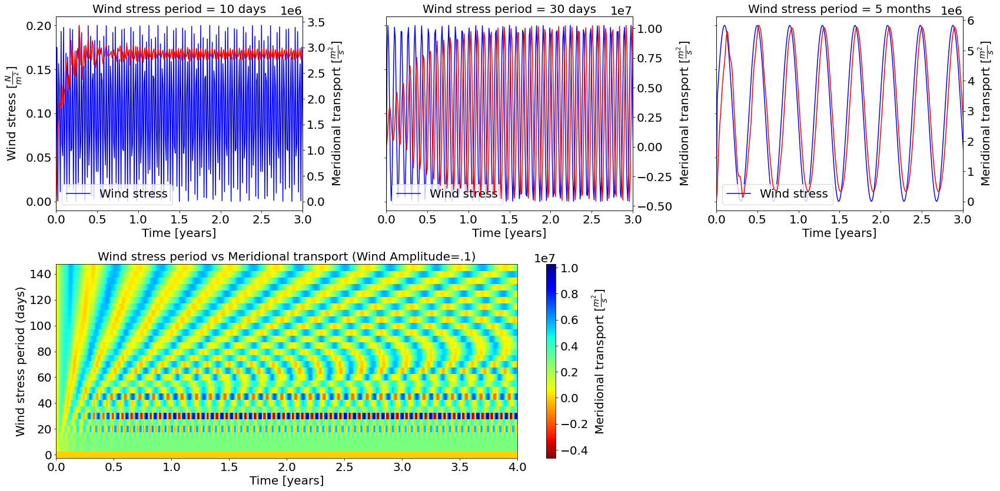

In [116]:
#Meridional transport vs. wind stress period at wind stress amplitude .1
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[:,2,2]/t1year,tau[:,2,2],color="b",label='Wind stress') 
ax2.plot(t[:,2,2]/t1year,tfs[:,2,2]*Lx*H/f,color='r',label='Geostrophic meridional transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$',size=20)
ax[0,0].set_title('Wind stress period = 10 days',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(0,3)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,1].plot(t[:,6,2]/t1year,tau[:,6,2],color="b",label='Wind stress') 
ax4=ax[0,1].twinx()
ax4.plot(t[:,6,2]/t1year,tfs[:,6,2]*Lx*H/f,color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Wind stress period = 30 days',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(0,3)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,2].plot(t[:,29,2]/t1year,tau[:,29,2],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[:,29,2]/t1year,tfs[:,29,2]*Lx*H/f,color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Wind stress period = 5 months',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(0,3)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
r=np.zeros(Ntau)
for i in range(1,Ntau,1):
    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t[:,1,2]/t1year,r/3600/24,tfs[:,:,2].T*Lx*H/f,label='Wind stress',cmap='jet_r',shading='auto')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Wind stress period (days)',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Wind stress period vs Meridional transport (Wind Amplitude=.1)',size=20)
axbig.set_xlim(0,4)
ax.tick_params(labelsize=12)



plt.tight_layout()

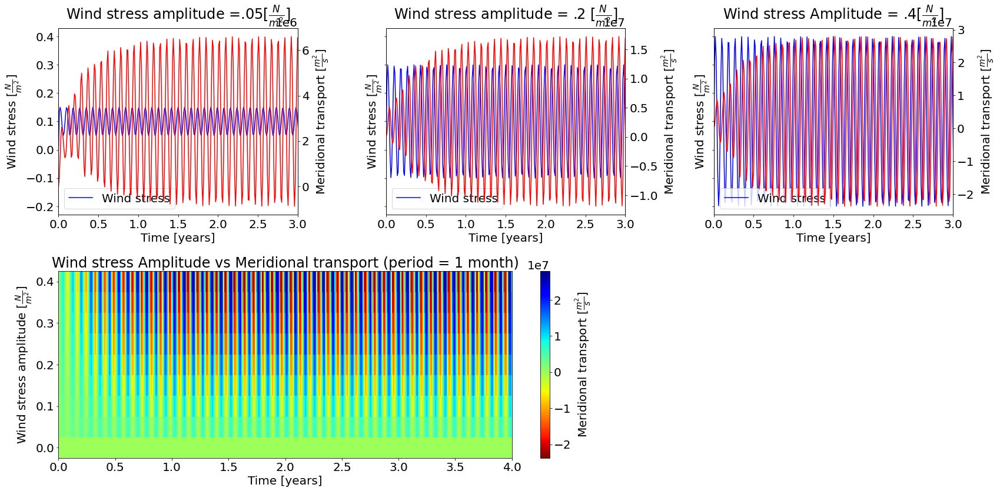

In [117]:
#Meridional transport vs. wind stress amplitude at a period of 30 days and 5 months
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[:,6,1]/t1year,tau[:,6,1],color="b",label='Wind stress') 
ax2.plot(t[:,6,1]/t1year,tfs[:,6,1]*Lx*H/f,color='r',label='Geostrophic meridional transport')
ax[0,0].set_xlabel('Time [years]')
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$')
ax[0,0].set_title('Wind stress amplitude =.05'r'$[\frac{N}{m^2}]$')
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(0,3)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$')
ax[0,1].plot(t[:,6,4]/t1year,tau[:,6,4],color="b",label='Wind stress') 
ax4=ax[0,1].twinx()
ax4.plot(t[:,6,4]/t1year,tfs[:,6,4]*Lx*H/f,color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]')
ax[0,1].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$')
ax[0,1].set_title('Wind stress amplitude = .2 'r'$[\frac{N}{m^2}]$')
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(0,3)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$')
ax[0,2].plot(t[:,6,6]/t1year,tau[:,6,6],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[:,6,8]/t1year,tfs[:,6,8]*Lx*H/f,color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]')
ax[0,2].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$')
ax[0,2].set_title('Wind stress Amplitude = .4'r'$[\frac{N}{m^2}]$')
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(0,3)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$')
for i in range(1,Namp,1):
    m[i]=(i*damp)/100
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t[:,1,2]/t1year,m,tfs[:,6,:].T*Lx*H/f,label='Wind stress',cmap='jet_r',shading='nearest')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Wind stress amplitude 'r'$[\frac{N}{m^2}]$')
axbig.set_xlabel('Time [years]')
axbig.set_title('Wind stress Amplitude vs Meridional transport (period = 1 month)')
axbig.set_xlim(0,4)

plt.tight_layout()

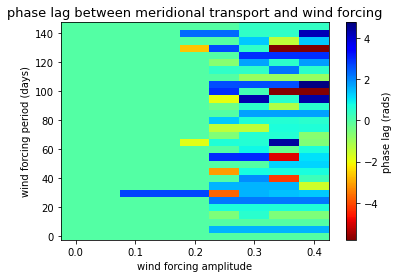

In [180]:
fig=plt.figure()
ax=fig.add_subplot(111)
plt.set_cmap('jet_r')
A=ax.pcolormesh(m,r/3600/24,-1*lag[0,:,:],shading='nearest')
plt.ylabel('wind forcing period (days)',size=10)
plt.xlabel('wind forcing amplitude',size=10)
plt.title('phase lag between meridional transport and wind forcing',size=13)
plt.colorbar(A,label='phase lag (rads)')
ax.tick_params(labelsize=10)

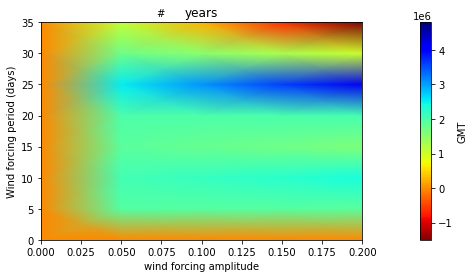

In [217]:
#intializing figure for animation

fig, ax = plt.subplots(figsize=(8,4))
#ax.set_ylim((-.3, .3))
#ax2=ax.twinx()
#ax2.plot(x,etab,'--',color='k')
ax.set_ylabel('Wind forcing period (days)')
#ax2.set_ylabel('ridge height (m)')
ax.set_xlabel('wind forcing amplitude')
ax.set_title('years')
ttl = ax.text(.36, 1.03, '#', transform = ax.transAxes)
quad = ax.pcolormesh(m,r,GMT[10,:,:],cmap='jet_r',vmin=-1.5e6,vmax=4.8e6,shading='gouraud')
fig.colorbar(quad,pad=.13, label='GMT')
#plt.savefig('6MonthWindPeriod_streamfunction.png')

In [218]:
def animate(i):
    quad.set_array((GMT[i,:,:]).ravel())
    ttl.set_text((t[i,1,1]/t1year))
    return (quad)

In [219]:
anim = animation.FuncAnimation(fig, animate,
                               frames=Nt_save, interval=60, 
                               repeat=True)

In [220]:
HTML(anim.to_jshtml())

In [221]:
writervideo = animation.PillowWriter(fps=30)
anim.save('PeriodVsAmplitudeGMT.gif', writer=writervideo,dpi=150)

In [205]:
############ 2 Layer Results ############

In [10]:
psi1,psi2,U1,U2,t,tfs,ifs,tau=twoLayerBaroclinicFluid(.1,.1,10e80,1.5e6,400)

KeyboardInterrupt: 

In [198]:
def standing(psi1,psi2,tau,U1,U2,ifs,tfs):
    #IFS=(f/rg)*np.sum(np.real(dpsihat[1]*np.conj(psihat[0])))/N**2
    #TFS=np.sum(np.real(dpsihat[1]*np.conj(etabhat)))/N**2
    Conversion_to_Transient_Eddy=np.zeros(7)
    Drag_Dissipation=np.zeros(7)
    Viscos_Dissipation=np.zeros(7)
    psi1hat=np.fft.fft(psi1)
    psi2hat=np.fft.fft(psi2)
    dpsi1hat=1j*k*np.fft.fft(psi1)
    dpsi2hat=1j*k*np.fft.fft(psi2)
    d2psi1hat=-1*k**2*np.fft.fft(psi1)
    d2psi2hat=-1*k**2*np.fft.fft(psi2)
    Baroclinic_Conversion=(U1-U2)*(f**2/rg)*np.sum(np.real(np.abs(dpsi2hat*np.conj(psi1hat))),axis=1)/N**2
    Topo_Conversion=-f*U2*tfs
    Drag_Dissipation[:]=-rb*np.sum(np.real(k**2*np.abs(psi2hat)**2),axis=1)/N**2
    Viscos_Dissipation[:]=-nu*(H1*((np.sum(np.real(k**4*np.abs(psi1hat)**2),axis=1))/N**2)+(H2*np.sum(np.real(k**4*np.abs(psi2hat)**2),axis=1)/N**2))
    Conversion_to_Transient_Eddy[:]=-K*f**2*(((np.sum(np.real(k**2*np.abs((psi1hat-psi2hat))**2),axis=1)/N**2)))/rg
    #Conversion_to_Transient_Eddy[:]=-K*f**2*(((np.sum(np.real(k**2*np.abs(psi1hat)**2),axis=1)/N**2)+(np.sum(np.real(k**2*np.abs(psi2hat)**2),axis=1)/N**2)-(np.sum(np.real(np.abs(k*psi2hat*np.conj(k*psi1hat))),axis=1)/N**2)-(np.sum(np.real(np.abs(k*psi1hat*np.conj(k*psi2hat))),axis=1)/N**2)))/rg
    return Baroclinic_Conversion,Topo_Conversion,Drag_Dissipation,Viscos_Dissipation,Conversion_to_Transient_Eddy,tau

In [129]:
def meanflow(psi1,psi2,tau,U1,U2,ifs,tfs):
    #Baroclinic_Conversion=-f*(U1-U2)*ifs
    dpsi2hat=1j*k*np.fft.fft(psi2)
    psi1hat=np.fft.fft(psi1)
    Baroclinic_Conversion=-(U1-U2)*(f**2/rg)*np.sum(np.real(np.abs(dpsi2hat*np.conj(psi1hat))),axis=1)/N**2
    Topo_Conversion=f*U2*tfs
    Creation_by_Wind=tau*U1/rho0
    Destruction_by_Drag=-rb*U2**2
    Production_by_Buoyancy=f*Taabw*(U2-U1)/Lx
    Transient_eddy=-K*f**2*((U1-U2)**2)/rg
    return Baroclinic_Conversion, Topo_Conversion, Creation_by_Wind, Destruction_by_Drag, Production_by_Buoyancy, Transient_eddy,tau

In [ ]:
# constant Taabw
Taabw = 1.5e6
for j in range(15,250,50):
    tau_1=j/100
    for i in range(6,90,3):
        tau_p=i*tau_d
        psi1,psi2,U1,U2,t,tfs,ifs,tau=twoLayerBaroclinicFluid(.1,tau_1,tau_p,Taabw)

3177.4558708667755
3359.7530403137207
3208.9829268455505


In [48]:
#to load in data
tau_0=0.01
tau_1=.1
tau_p=1e50
Taabw=1.5e6
filename=twoLayerFile(tau_0,tau_1,tau_p,Taabw,400)
data= np.load("data/"+filename)
U1=data['U1']
U2=data["U2"]
psi1=data['psi1']
psi2=data['psi2']
t=data['t']
tfs=data['tfs']
ifs=data['ifs']
tau=data['tau']


In [137]:
#to load in multiple data at steady state
U1=[]
U2=[]
psi1=[]
psi2=[]
t=[]
tfs=[]
ifs=[]
tau=[]
U12=[]
psi12=[]
psi22=[]
t2=[]
tfs2=[]
ifs2=[]
tau2=[]
U13=[]
U23=[]
psi13=[]
psi23=[]
t3=[]
tfs3=[]
ifs3=[]
tau3=[]
Taabw=0
tau_1=.1
#tau_0=.1
tau_p=10e50
K=200
listwind=[0.01,0.017,0.03,0.05,0.1,0.17,0.3]
#listwind=[0.01,0.017,0.03,0.05,.1]
#periods=[6,10,15,20,25,30,60,360]
#aabw=[.5e6,1e6,1.25e6,1.5e6,1.75e6,2e6,2.5e6,3e6]
#amps=[.05,.1,.2,.3,.4]
#for j in range(6,30,3):
  #  tau_p=j*tau_d
for i in range(0,7,1):
    tau_0=listwind[i]
    filename=twoLayerFile(tau_0,tau_1,tau_p,Taabw,K)
    data= np.load("data/"+filename)
    U1.append(data['U1'][-1])
    U2.append(data['U2'][-1])
    psi1.append(data['psi1'][-1])
    psi2.append(data['psi2'][-1])
    t.append(data['t'][-1])
    tfs.append(data['tfs'][-1])
    ifs.append(data['ifs'][-1])
    tau.append(data['tau'][-1])


In [138]:
U1=np.array(U1)
U2=np.array(U2)
psi1=np.array(psi1)
psi2=np.array(psi2)
t=np.array(t)
tfs=np.array(tfs)
ifs=np.array(ifs)
tau=np.array(tau)


In [199]:
Baroclinic_Conversion,Topo_Conversion,Drag_Dissipation,Viscos_Dissipation,Conversion_to_Transient_Eddy,tau=standing(psi1,psi2,tau,U1,U2,ifs,tfs)

In [97]:
Baroclinic_Conversion, Topo_Conversion, Creation_by_Wind, Destruction_by_Drag, Production_by_Buoyancy, Transient_eddy,tau=meanflow(psi1,psi2,tau,U1,U2,ifs,tfs)

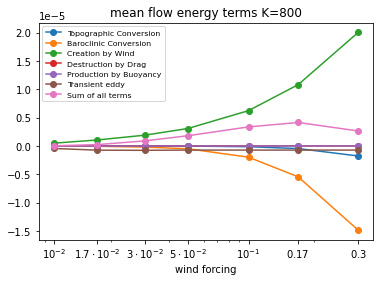

In [98]:
plt.plot(tau,np.real(Topo_Conversion),marker='o',label='Topographic Conversion')
plt.plot(tau,np.real(Baroclinic_Conversion),marker='o',label='Baroclinic Conversion')
plt.plot(tau,np.real(Creation_by_Wind),marker='o',label='Creation by Wind')
plt.plot(tau,np.real(Destruction_by_Drag),marker='o',label='Destruction by Drag')
plt.plot(tau,np.real(Production_by_Buoyancy),marker='o',label='Production by Buoyancy')
plt.plot(tau,np.real(Transient_eddy),marker='o',label='Transient eddy')
plt.plot(tau,np.real(Transient_eddy+Production_by_Buoyancy+Destruction_by_Drag+Creation_by_Wind+Baroclinic_Conversion+Topo_Conversion),marker='o',label='Sum of all terms')
plt.xlabel('wind forcing')
plt.xscale('logit')
plt.gca().xaxis.set_major_locator(FixedLocator(listwind))
plt.gca().xaxis.set_minor_formatter(NullFormatter())
plt.xticks(listwind)
plt.title('mean flow energy terms K=800')
plt.legend(loc='upper left',fontsize=7.8)
#plt.savefig('meanFlow_energy_terms_K_800')

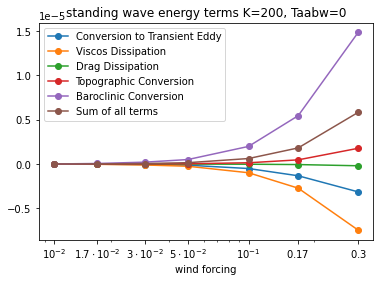

In [200]:
from matplotlib.ticker import NullFormatter, FixedLocator
plt.plot(tau,Conversion_to_Transient_Eddy,marker='o',label='Conversion to Transient Eddy')
plt.plot(tau,np.real(Viscos_Dissipation),marker='o',label='Viscos Dissipation')
plt.plot(tau,np.real(Drag_Dissipation),marker='o',label='Drag Dissipation')
plt.plot(tau,np.real(Topo_Conversion),marker='o',label='Topographic Conversion')
plt.plot(tau,np.real(Baroclinic_Conversion),marker='o',label='Baroclinic Conversion')
plt.plot(tau,np.real(Baroclinic_Conversion+Topo_Conversion+Drag_Dissipation+Viscos_Dissipation+Conversion_to_Transient_Eddy),marker='o',label='Sum of all terms')
plt.xlabel('wind forcing')
plt.xscale('logit')
plt.gca().xaxis.set_major_locator(FixedLocator(listwind))
plt.gca().xaxis.set_minor_formatter(NullFormatter())
plt.xticks(listwind)
plt.title('standing wave energy terms K=200, Taabw=0')
plt.legend(loc='best')
#plt.savefig('standingWave_energy_terms_K_200_Taabw_0')

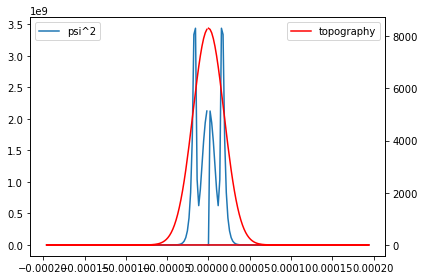

In [197]:
plt.plot(np.real(k.mean(axis=0)),np.mean(np.real(np.abs(np.fft.fft(psi2))**2),axis=0),label='psi^2')
plt.legend(loc='upper left')
plt.twinx()
plt.plot(k.mean(axis=0),np.real(np.abs(etabhat)),color='r',label='topography')
plt.legend(loc='best')
plt.tight_layout()
plt.savefig('psi2_sqred_vs_k')

In [131]:
# terms
S=(U2-U1)*f/rg
Ekman=Lx*rb*U2/f #bottom ekman
Eddy=-Lx*K*S #transient eddy
D=f*Taabw/Lx/H1 #Northward 
E=f*(psi2-psi1)/rg #eta prime
E1=((np.mean(psi2,axis=1))-(np.mean(psi1,axis=1))) #eta x ave
F=np.sqrt(rg*H1)/f #Ld1
G=H1*(U1-U2)*Ly #Baroclinic 
I=((H1*U1)+(H2*U2))*Ly #total zonal
J=(H1+H2)*U2*Ly #barotropic bottom
X=(H1+H2)*U1*Ly #barotropic top

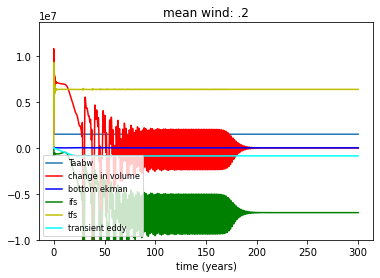

In [160]:
#change in volume beneath isopynical
aw=0*tau
for i in range(0,len(tau)):
    aw[i]=Taabw

plt.plot(t/t1year,aw,label='Taabw')
plt.plot(t/t1year,aw-Ekman+(Lx*ifs)+(Lx*tfs)-(K*S*Lx),color='r',label='change in volume')
plt.plot(t/t1year,-Ekman,color='blue',label='bottom ekman')
plt.plot(t/t1year,Lx*ifs,color='g',label='ifs')
plt.plot(t/t1year,tfs*Lx,color='y',label='tfs')
plt.plot(t/t1year,-K*S*Lx,color="aqua",label='transient eddy')
plt.xlabel("time (years)")
plt.ylim(-1e7)
plt.legend(loc='lower left',fontsize=8)
plt.title("mean wind: .2")
plt.savefig("VolumePlot_meanWind_.2.png")

In [47]:
#calculating meridional transport / change in volume under the isopyncal 
MT=0*tau
taabw=0*tau
for i in range(0,len(tau)):
    for j in range(len(tau[1])):
        taabw[i]= 1.5e6#array for Taabw

for i in range(len(tau)):
    Ekman=Lx*rb*U2[i]/f #bottom ekman

    Eddy=-Lx*K*((U2[i]-U1[i])*f/rg) #transient eddy

    MT[i]=taabw[i]-Ekman+(Lx*ifs[i])+(Lx*tfs[i])+Eddy #change in volume 

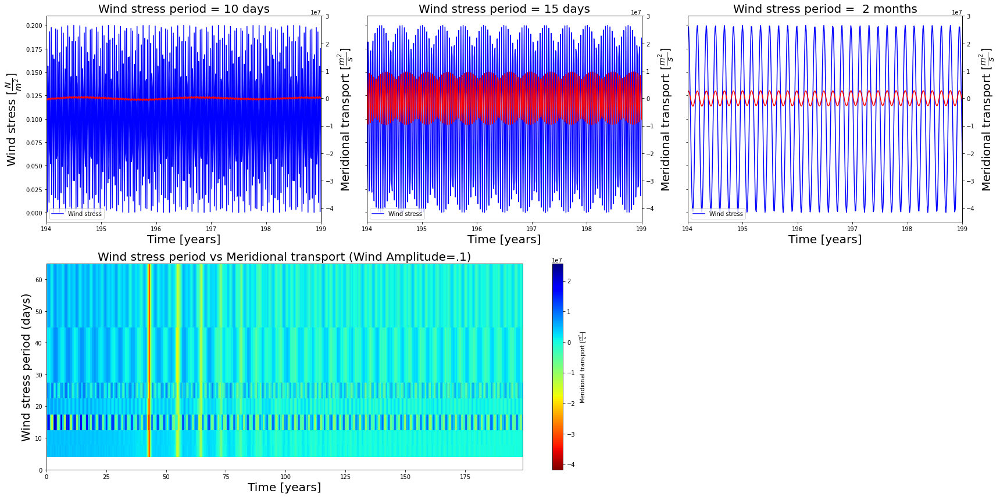

In [80]:
#Meridional transport vs. wind stress period at an amplitude of .1
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[1,:]/t1year,tau[1,:],color="b",label='Wind stress') 
ax2.plot(t[1,:]/t1year,MT[1,:],color='r',label='meridional transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$',size=20)
ax[0,0].set_title('Wind stress period = 10 days',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(194,199)
ax2.set_ylim(-4.5e7,3e7)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,1].plot(t[4,:]/t1year,tau[2,:],color="b",label='Wind stress') 
ax3=ax[0,1].twinx()
ax3.plot(t[4,:]/t1year,MT[2,:],color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Wind stress period = 15 days',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(194,199)
ax3.set_ylim(-4.5e7,3e7)
ax3.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,2].plot(t[7,:]/t1year,tau[6,:],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[7,:]/t1year,MT[6,:],color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Wind stress period =  2 months',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(194,199)
ax4.set_ylim(-4.5e7,3e7)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t/t1year,periods,MT[:,:],label='Wind stress',cmap='jet_r',shading='auto')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Wind stress period (days)',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Wind stress period vs Meridional transport (Wind Amplitude=.1)',size=20)
axbig.set_xlim(0,199)
axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)



plt.tight_layout()

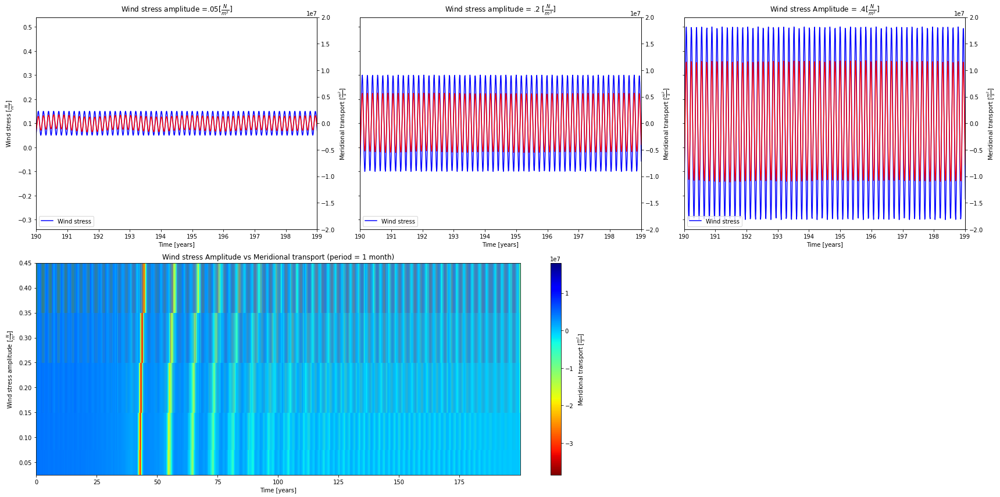

In [91]:
#Meridional transport vs. wind stress amplitude at a period of 60 days
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[0,:]/t1year,tau[0,:],color="b",label='Wind stress') 
ax2.plot(t[0,:]/t1year,MT[0,:],color='r',label='Geostrophic meridional transport')
ax[0,0].set_xlabel('Time [years]')
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$')
ax[0,0].set_title('Wind stress amplitude =.05'r'$[\frac{N}{m^2}]$')
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(190,199)
ax2.set_ylim(-2e7,2e7)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$')
ax[0,1].plot(t[2,:]/t1year,tau[2,:],color="b",label='Wind stress') 
ax4=ax[0,1].twinx()
ax4.plot(t[2,:]/t1year,MT[2,:],color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]')
ax4.set_ylim(-2e7,2e7)
#ax[0,1].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$')
ax[0,1].set_title('Wind stress amplitude = .2 'r'$[\frac{N}{m^2}]$')
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(190,199)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$')
ax[0,2].plot(t[4,:]/t1year,tau[4,:],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.set_ylim(-2e7,2e7)
ax4.plot(t[4,:]/t1year,MT[4,:],color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]')
#ax[0,2].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$')
ax[0,2].set_title('Wind stress Amplitude = .4'r'$[\frac{N}{m^2}]$')
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(190,199)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$')
#for i in range(1,Namp,1):
#    m[i]=(i*damp)/100
#gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t/t1year,amps,MT[:,:],label='Wind stress',cmap='jet_r',shading='nearest')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Wind stress amplitude 'r'$[\frac{N}{m^2}]$')
axbig.set_xlabel('Time [years]')
axbig.set_title('Wind stress Amplitude vs Meridional transport (period = 1 month)')
#axbig.set_xlim(0,4)

plt.tight_layout()

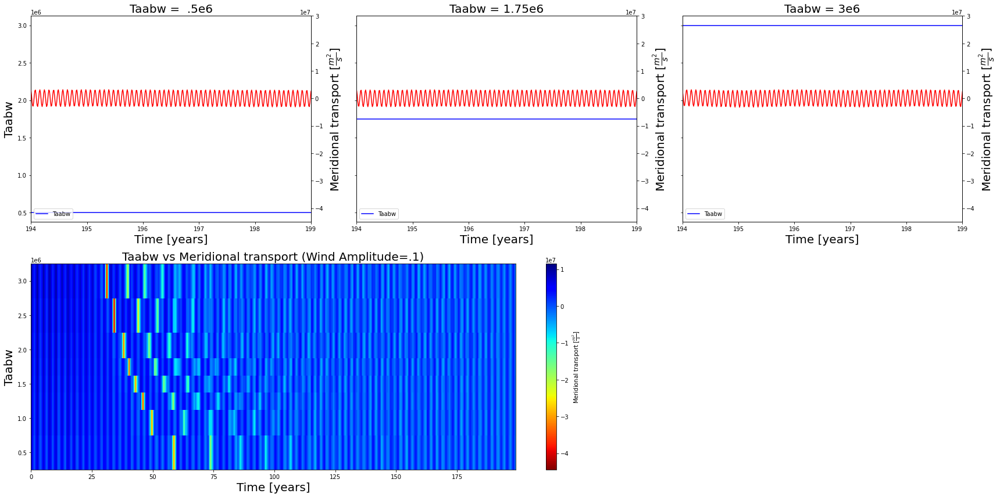

In [110]:
#Meridional transport vs. Taabw at an wind mean and amplitude of .1 and period of 30 days
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[0,:]/t1year,taabw[0],color="b",label='Taabw') 
ax2.plot(t[0,:]/t1year,MT[0,:],color='r',label='meridional transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Taabw',size=20)
ax[0,0].set_title('Taabw =  .5e6',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(194,199)
ax2.set_ylim(-4.5e7,3e7)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,1].plot(t[4,:]/t1year,taabw[4],color="b",label='Taabw') 
ax3=ax[0,1].twinx()
ax3.plot(t[4,:]/t1year,MT[4,:],color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Taabw = 1.75e6',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(194,199)
ax3.set_ylim(-4.5e7,3e7)
ax3.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,2].plot(t[7,:]/t1year,taabw[7],color="b",label='Taabw') 
ax4=ax[0,2].twinx()
ax4.plot(t[7,:]/t1year,MT[7,:],color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Taabw = 3e6',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(194,199)
ax4.set_ylim(-4.5e7,3e7)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t/t1year,taabw,MT[:,:],label='Taabw',cmap='jet_r',shading='auto')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Taabw',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Taabw vs Meridional transport (Wind Amplitude=.1)',size=20)
axbig.set_xlim(0,199)
#axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)



plt.tight_layout()

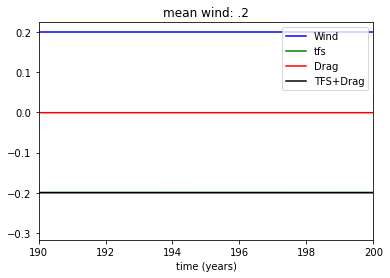

In [161]:
#wind vs TFS

plt.plot(t/t1year,tau,color='b',label='Wind')
plt.plot(t/t1year,tfs*f*rho0,color='g',label='tfs')
plt.plot(t/t1year,-rho0*rb*U2,color='r',label='Drag')
plt.plot(t/t1year,tfs*f*rho0-rho0*rb*U2,color='k',label='TFS+Drag')
plt.xlabel("time (years)")
plt.xlim(190,200)
plt.legend(loc='best')
plt.title("mean wind: .2")
plt.savefig("Wind_TFSPlot_meanWind_.2.png")

Text(0.5, 1.0, 'mean wind: .01')

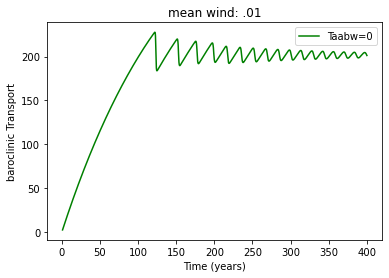

In [50]:
#Transport
G=H1*(U1-U2)*Ly
#plt.plot(t[200:]/t1year,I[200:],color="b",label='total zonal')
plt.plot(t[100:]/t1year,G[100:]/1e6,color='g',label='Taabw=0')
#plt.plot(t[200:]/t1year,J[200:],color='r',label='barotropic bottom')
#plt.plot(t[200:]/t1year,X[200:],color='c',label='barotropic top')
plt.ylabel("baroclinic Transport")
plt.xlabel("Time (years)")
plt.legend(loc='best')
plt.title("mean wind: .01")
#plt.savefig("baroclinic_meanWind_.01_Taabw_0.png")

In [116]:
G=tau*0
for i in range (len(tau)):
    G[i]=H1*(U1[i]-U2[i])*Ly

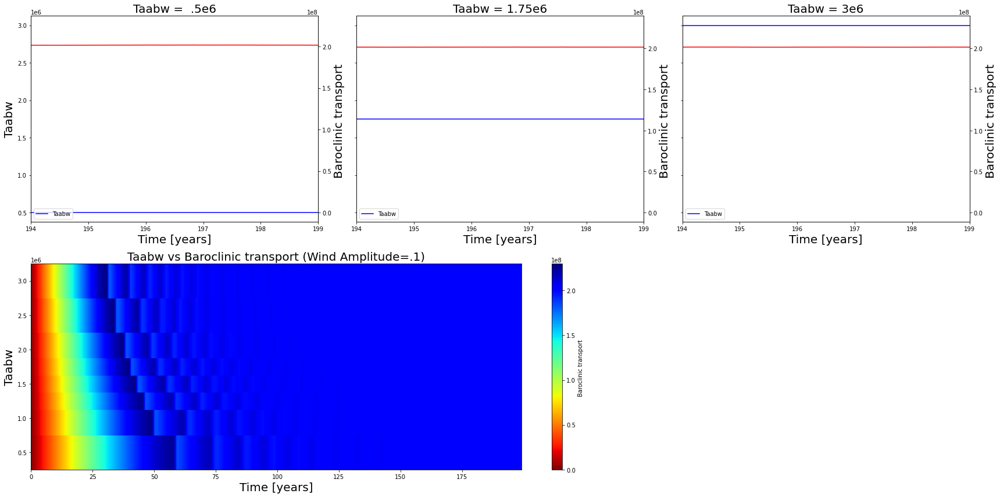

In [118]:
#Meridional transport vs. Taabw at an wind mean and amplitude of .1 and period of 30 days
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[0,:]/t1year,taabw[0],color="b",label='Taabw') 
ax2.plot(t[0,:]/t1year,G[0,:],color='r',label='baroclinic transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Taabw',size=20)
ax[0,0].set_title('Taabw =  .5e6',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(194,199)
#ax2.set_ylim(-4.5e7,3e7)
ax2.set_ylabel('Baroclinic transport ',size=20)
ax[0,1].plot(t[4,:]/t1year,taabw[4],color="b",label='Taabw') 
ax3=ax[0,1].twinx()
ax3.plot(t[4,:]/t1year,G[4],color='r',label='baroclinic transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Taabw = 1.75e6',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(194,199)
#ax3.set_ylim(-4.5e7,3e7)
ax3.set_ylabel('Baroclinic transport ',size=20)
ax[0,2].plot(t[7,:]/t1year,taabw[7],color="b",label='Taabw') 
ax4=ax[0,2].twinx()
ax4.plot(t[7,:]/t1year,G[7],color='r',label='baroclinic transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Taabw = 3e6',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(194,199)
#ax4.set_ylim(-4.5e7,3e7)
ax4.set_ylabel('Baroclinic transport ',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t/t1year,taabw,G[:,:],label='Taabw',cmap='jet_r',shading='auto')
plt.colorbar(A,ax=axbig,label='Baroclinic transport ')
axbig.set_ylabel('Taabw',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Taabw vs Baroclinic transport (Wind Amplitude=.1)',size=20)
axbig.set_xlim(0,199)
#axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)



plt.tight_layout()

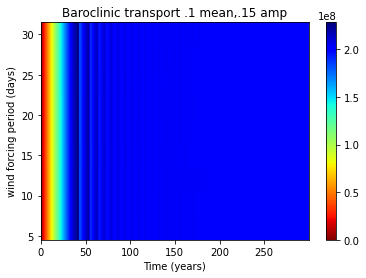

In [175]:
tau_p=[]
for i in range(6,33,3):
    tau_p.append(i)
tau_p=np.array(tau_p)
G=np.zeros((9,30000))
for i in range(0,9,1):
    G[i,:]=H1*(U1[i]-U2[i])*Ly
plt.pcolormesh(t/t1year,tau_p,G[:,:],cmap='jet_r',shading='nearest')
plt.colorbar()
plt.xlabel("Time (years)")
plt.ylabel("wind forcing period (days)")
plt.title("Baroclinic transport .1 mean,.15 amp")
plt.savefig("BclinicTrans_period.png")

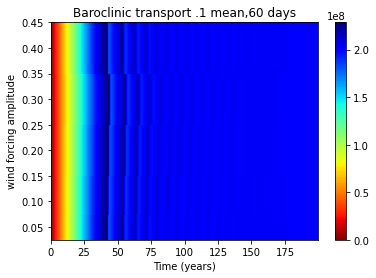

In [191]:
G=np.zeros((5,20000))
for i in range(0,5,1):
    G[i,:]=H1*(U1[i]-U2[i])*Ly
plt.pcolormesh(t/t1year,tau_1,G[:,:],cmap='jet_r',shading='nearest')
plt.colorbar()
plt.xlabel("Time (years)")
plt.ylabel("wind forcing amplitude")
plt.title("Baroclinic transport .1 mean,60 days")
plt.savefig("BclinicTrans_windamp.png")

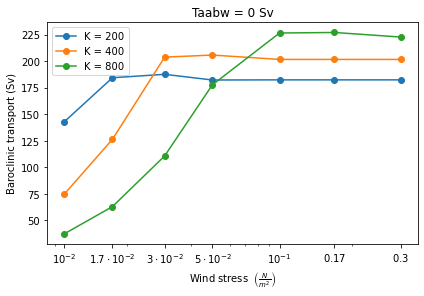

In [71]:
from matplotlib.ticker import NullFormatter, FixedLocator
G1=np.zeros(7)
G2=np.zeros(7)
G3=np.zeros(7)
for i in range(0,7,1):
    G1[i]=H1*(U1[i]-U2[i])*Ly
    G2[i]=H1*(U1[i+7]-U2[i+7])*Ly
    G3[i]=H1*(U1[i+14]-U2[i+14])*Ly
plt.plot(listwind,G1[:]/1e6,marker='o',label='K = 200')
plt.plot(listwind,G2[:]/1e6,marker='o',label='K = 400')
plt.plot(listwind,G3[:]/1e6,marker='o',label='K = 800')
#plt.plot(listwind,G3[:]/1e8,marker='o',label='Taabw = 1.5 Sv')
plt.legend(loc='best')
plt.xlabel('Wind stress  'r'$\left(\frac{N}{m^2}\right)$')
plt.ylabel("Baroclinic transport (Sv)")
plt.xscale('logit')
plt.gca().xaxis.set_major_locator(FixedLocator(listwind))
plt.gca().xaxis.set_minor_formatter(NullFormatter())
plt.xticks(listwind)
plt.tight_layout()
plt.title("Taabw = 0 Sv")
plt.savefig("BclinicTrans_constantwind_logMeanWind_changeK_Taabw0.png")

In [157]:
I=tau*0
for i in range (len(tau)):
    I[:]=((H1*U1[:])+(H2*U2[:]))*Ly
#periods=[6,9,12,15,18,21,24,27,30]

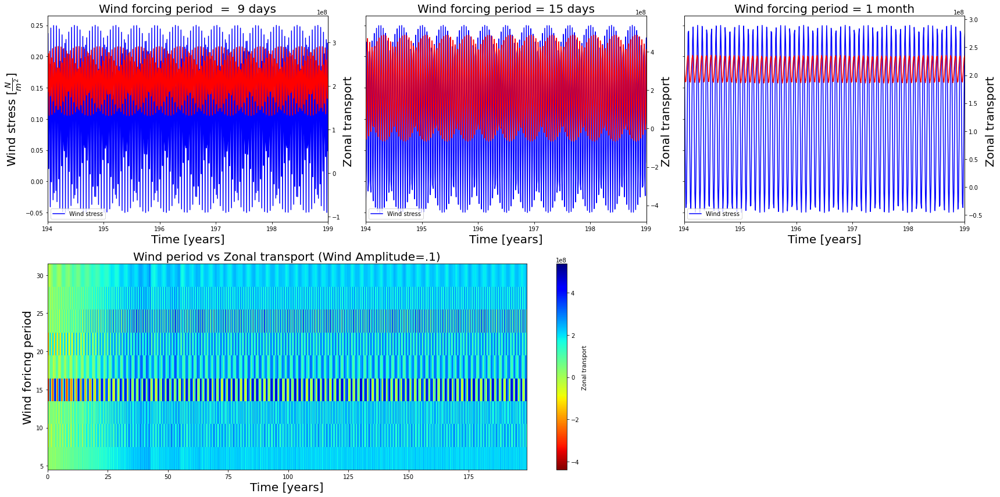

In [153]:
# at .1 mean and .15 amp
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[0]/t1year,tau[1],color="b",label='Wind stress') 
ax2.plot(t[0]/t1year,I[1],color='r',label='Zonal transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$',size=20)
ax[0,0].set_title('Wind forcing period  =  9 days',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(194,199)
#ax2.set_ylim(-4.5e7,3e7)
ax2.set_ylabel('Zonal transport ',size=20)
ax[0,1].plot(t[4]/t1year,tau[3],color="b",label='Wind stress') 
ax3=ax[0,1].twinx()
ax3.plot(t[4]/t1year,I[3],color='r',label='Zonal transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Wind forcing period = 15 days',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(194,199)
#ax3.set_ylim(-4.5e7,3e7)
ax3.set_ylabel('Zonal transport ',size=20)
ax[0,2].plot(t[7]/t1year,tau[8],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[7]/t1year,I[8],color='r',label='Zonal transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Wind forcing period = 1 month',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(194,199)
#ax4.set_ylim(-4.5e7,3e7)
ax4.set_ylabel('Zonal transport ',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t/t1year,periods,I[:,:],label='Wind forcing period',cmap='jet_r',shading='auto')
plt.colorbar(A,ax=axbig,label='Zonal transport ')
axbig.set_ylabel('Wind foricng period',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Wind period vs Zonal transport (Wind Amplitude=.1)',size=20)
axbig.set_xlim(0,199)
#axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)


plt.tight_layout()
plt.savefig("")

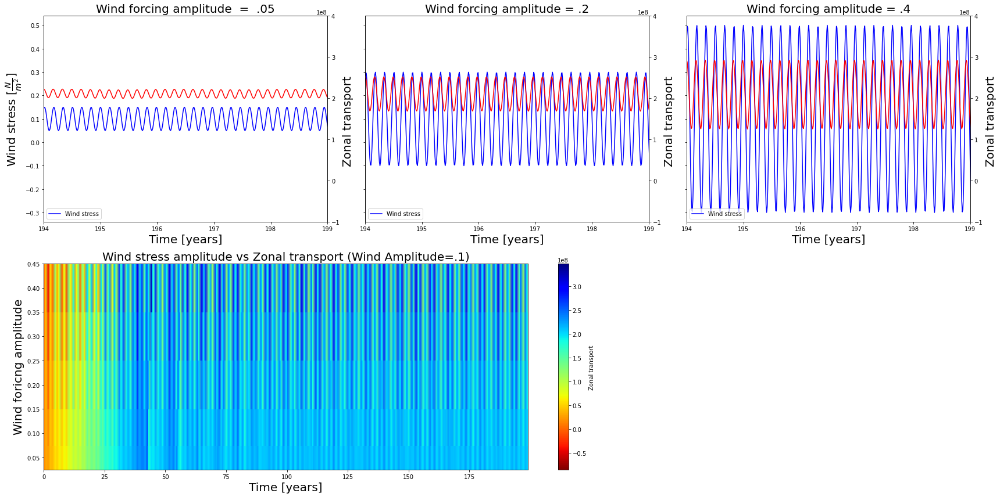

In [161]:
# at .1 mean and .15 amp
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[0]/t1year,tau[0],color="b",label='Wind stress') 
ax2.plot(t[0]/t1year,I[0],color='r',label='Zonal transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$',size=20)
ax[0,0].set_title('Wind forcing amplitude  =  .05',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(194,199)
ax2.set_ylim(-1e8,4e8)
ax2.set_ylabel('Zonal transport ',size=20)
ax[0,1].plot(t[4]/t1year,tau[2],color="b",label='Wind stress') 
ax3=ax[0,1].twinx()
ax3.plot(t[4]/t1year,I[2],color='r',label='Zonal transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Wind forcing amplitude = .2',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(194,199)
ax3.set_ylim(-1e8,4e8)
ax3.set_ylabel('Zonal transport ',size=20)
ax[0,2].plot(t[4]/t1year,tau[4],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[4]/t1year,I[4],color='r',label='Zonal transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Wind forcing amplitude = .4',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(194,199)
ax4.set_ylim(-1e8,4e8)
ax4.set_ylabel('Zonal transport ',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t/t1year,amps,I[:,:],label='Wind forcing amplitude',cmap='jet_r',shading='auto')
plt.colorbar(A,ax=axbig,label='Zonal transport ')
axbig.set_ylabel('Wind foricng amplitude',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Wind stress amplitude vs Zonal transport (Wind Amplitude=.1)',size=20)
axbig.set_xlim(0,199)
#axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)


plt.tight_layout()
#plt.savefig("")

In [ ]:
###plots varying K###

In [35]:
listwind=np.array(listwind)

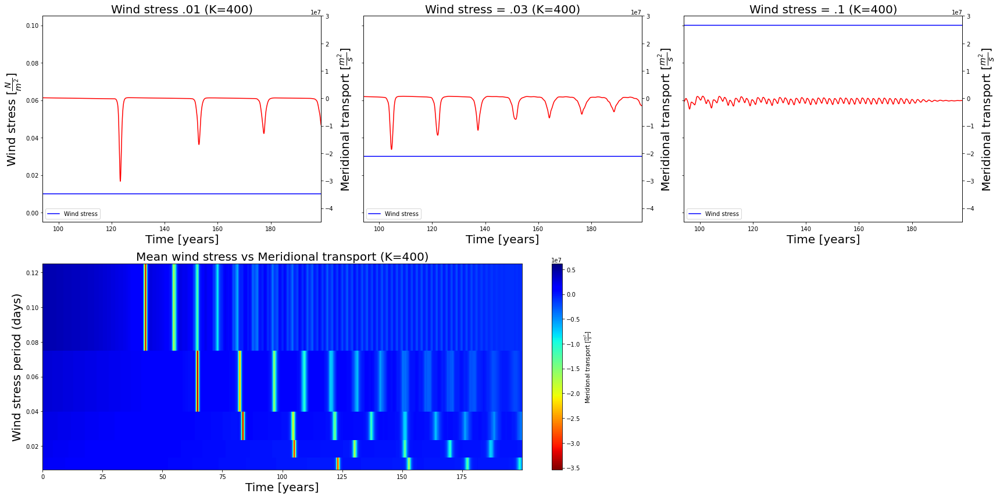

In [57]:
#Meridional transport vs. wind stress (constant wind)
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[1,:]/t1year,tau[0,:],color="b",label='Wind stress') 
ax2.plot(t[1,:]/t1year,MT[0,:],color='r',label='meridional transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$',size=20)
ax[0,0].set_title('Wind stress .01 (K=400)',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(94,199)
ax2.set_ylim(-4.5e7,3e7)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,1].plot(t[4,:]/t1year,tau[2,:],color="b",label='Wind stress') 
ax3=ax[0,1].twinx()
ax3.plot(t[4,:]/t1year,MT[2,:],color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Wind stress = .03 (K=400)',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(94,199)
ax3.set_ylim(-4.5e7,3e7)
ax3.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,2].plot(t[7,:]/t1year,tau[4,:],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[7,:]/t1year,MT[4,:],color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Wind stress = .1 (K=400)',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(94,199)
ax4.set_ylim(-4.5e7,3e7)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t[0:5,:]/t1year,listwind,MT[0:5,:],label='Wind stress',cmap='jet_r',shading='nearest')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Wind stress period (days)',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Mean wind stress vs Meridional transport (K=400)',size=20)
#axbig.set_xlim(0,199)
#axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)



plt.tight_layout()

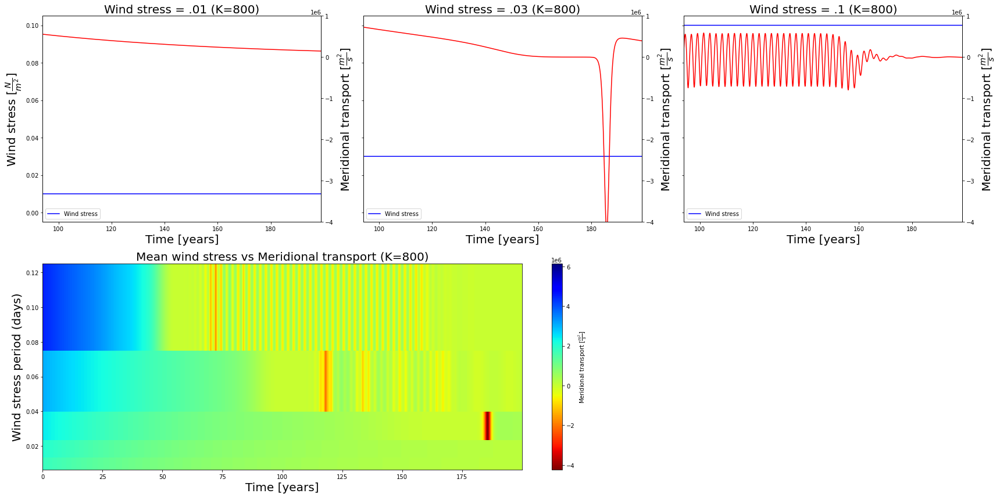

In [64]:
#Meridional transport vs. wind stress (constant wind)
fig, ax= plt.subplots(2,3, figsize = (24, 12),sharey=True)
ax2=ax[0,0].twinx()
ax[0,0].plot(t[1,:]/t1year,tau[5,:],color="b",label='Wind stress') 
ax2.plot(t[1,:]/t1year,MT[5,:],color='r',label='meridional transport')
ax[0,0].set_xlabel('Time [years]',size=20)
ax[0,0].set_ylabel('Wind stress 'r'$[\frac{N}{m^2}]$',size=20)
ax[0,0].set_title('Wind stress = .01 (K=800)',size=20)
ax[0,0].legend(loc='lower left')
ax[0,0].set_xlim(94,199)
ax2.set_ylim(-4e6,1e6)
ax2.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,1].plot(t[4,:]/t1year,tau[7,:],color="b",label='Wind stress') 
ax3=ax[0,1].twinx()
ax3.plot(t[4,:]/t1year,MT[7,:],color='r',label='Geostrophic meridional transport')
ax[0,1].set_xlabel('Time [years]',size=20)
ax[0,1].set_title('Wind stress = .03 (K=800)',size=20)
ax[0,1].legend(loc='lower left')
ax[0,1].set_xlim(94,199)
ax3.set_ylim(-4e6,1e6)
ax3.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
ax[0,2].plot(t[7,:]/t1year,tau[9,:],color="b",label='Wind stress') 
ax4=ax[0,2].twinx()
ax4.plot(t[7,:]/t1year,MT[9,:],color='r',label='Geostrophic meridional transport')
ax[0,2].set_xlabel('Time [years]',size=20)
ax[0,2].set_title('Wind stress = .1 (K=800)',size=20)
ax[0,2].legend(loc='lower left')
ax[0,2].set_xlim(94,199)
ax4.set_ylim(-4e6,1e6)
ax4.set_ylabel('Meridional transport 'r'$[\frac{m^2}{s}]$',size=20)
#r=np.zeros(Ntau)
#for i in range(1,Ntau,1):
#    r[i]=i*dtau
gs = ax[1, 2].get_gridspec()
axbig = fig.add_subplot(gs[1, 0:2])
for ax in ax[1, 0:]:
    ax.remove()
A=axbig.pcolormesh(t[5:10,:]/t1year,listwind,MT[5:10,:],label='Wind stress',cmap='jet_r',shading='nearest')
plt.colorbar(A,ax=axbig,label='Meridional transport 'r'$[\frac{m^2}{s}]$')
axbig.set_ylabel('Wind stress period (days)',size=20)
axbig.set_xlabel('Time [years]',size=20)
axbig.set_title('Mean wind stress vs Meridional transport (K=800)',size=20)
#axbig.set_xlim(0,199)
#axbig.set_ylim(0,65)
ax.tick_params(labelsize=12)



plt.tight_layout()

Text(0.5, 1.0, "$\\eta$'")

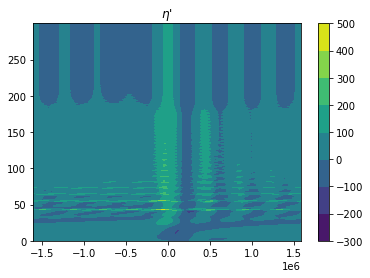

In [18]:
plt.contourf(x,t/t1year,E)
plt.colorbar()
plt.title(r'$\eta$'"'")

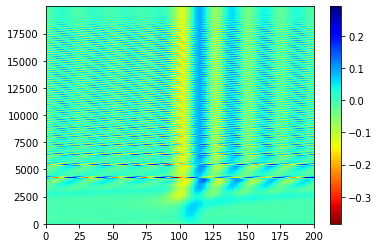

In [16]:
fig=plt.figure()
ax=fig.add_subplot(111)
plt.set_cmap('jet_r')
#c = ax.pcolor((f/rg)*(psi2[0:Nt_save-1,:]-psi1[0:Nt_save-1,:]))
c = ax.pcolor((f/g)*psi1[0:Nt_save-1,:])
fig.colorbar(c,ax=ax)

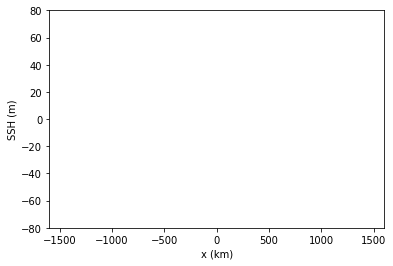

In [17]:
fig, ax = plt.subplots()

ax.set_xlim(( -Lx/2/1000, Lx/2/1000))
#ax.set_ylim((-.3, .7))
ax.set_ylim((-80, 80))
plt.ylabel('SSH (m)')
plt.xlabel('x (km)')

line, = ax.plot([], [], lw=2)

In [18]:
def init():
    line.set_data([], [])
    return (line,)

In [19]:
def animate(i):
    #line.set_data(x/1000, psi1[i,:]*f/g)
    line.set_data(x/1000, (psi2[i,:]-psi1[i,:])*f/rg)
    return (line,)

In [339]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=Nt_save, interval=60, 
                               blit=True)

In [356]:
HTML(anim.to_jshtml())

Animation size has reached 20975200 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


KeyboardInterrupt: 

In [315]:
print(np.max((psi2[i,:]-psi1[i,:])*f/rg))

9.42135733630475


In [387]:
print(ifs[20000-1])
print(tfs[20000-1])
print(aw[20000-1]/Lx)
print(-K*S[20000-1]+ifs[20000-1])

-0.7208739049735228
0.9976392595679148
0.46875
-0.990219742304896
